In [1]:
import pandas as pd
import matplotlib.pyplot as plt


In [2]:
basedf = pd.read_csv('dataset/base_train_sum.csv')
moneydf = pd.read_csv('dataset/money_report_train_sum.csv')
patentdf = pd.read_csv('dataset/patent_train_sum.csv')
reportdf = pd.read_csv('dataset/year_report_train_sum.csv')


In [3]:
# fill NA in basedf
basedfNumric = basedf[['ID', '注册时间', '注册资本', '控制人持股比例']]
basedfNumric = basedfNumric.fillna(basedfNumric.mean())
basedf = pd.concat([basedfNumric,
                    pd.get_dummies(basedf['行业'], prefix='行业'),
                    pd.get_dummies(basedf['区域'], prefix='区域'),
                    pd.get_dummies(basedf['企业类型'], prefix='企业类型'),
                    pd.get_dummies(basedf['控制人类型'], prefix='控制人类型'),
                    basedf['flag']], axis=1)


In [4]:
# fill NA in patentdf
patentdf = pd.concat([patentdf['ID'], 
                      pd.get_dummies(patentdf['专利'], prefix='专利'), 
                      pd.get_dummies(patentdf['商标'], prefix='商标'), 
                      pd.get_dummies(patentdf['著作权'], prefix='著作权')], axis=1)


In [5]:
moneydf.head()

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,28,2015.0,0.0,0.0,0.00,0.0000,21648.0,1298.88,0.0,0.000
1,230,2015.0,0.0,0.0,0.00,0.0000,0.0,0.00,470.4,28.224
2,429,2015.0,19340.0,1547.2,0.00,0.0000,0.0,0.00,0.0,0.000
3,693,2015.0,0.0,0.0,0.00,0.0000,0.0,0.00,5350.4,321.024
4,727,2015.0,0.0,0.0,32229.12,1289.1648,0.0,0.00,0.0,0.000


In [6]:
moneydf['债权融资额度'][moneydf['债权融资额度']!=0]/moneydf['债权融资成本'][moneydf['债权融资成本']!=0]

2        12.5
19       12.5
22       12.5
23       12.5
27       12.5
         ... 
45121    12.5
45123    12.5
45125    12.5
45129    12.5
45136     NaN
Length: 11852, dtype: float64

In [7]:
(moneydf['债权融资额度'][moneydf['债权融资额度']!=0]/moneydf['债权融资成本'][moneydf['债权融资成本']!=0]).isnull()

2        False
19       False
22       False
23       False
27       False
         ...  
45121    False
45123    False
45125    False
45129    False
45136     True
Length: 11852, dtype: bool

In [8]:
rate = moneydf['债权融资成本'][moneydf['债权融资成本']!=0]/moneydf['债权融资额度'][moneydf['债权融资额度']!=0]

In [9]:
rate[rate.isnull()]

73      NaN
90      NaN
176     NaN
187     NaN
235     NaN
         ..
44756   NaN
44823   NaN
45030   NaN
45099   NaN
45136   NaN
Length: 863, dtype: float64

In [10]:
moneydf['债权融资额度'][moneydf['债权融资额度'].isnull()]

73      NaN
90      NaN
339     NaN
796     NaN
807     NaN
         ..
44756   NaN
44823   NaN
45030   NaN
45099   NaN
45136   NaN
Name: 债权融资额度, Length: 447, dtype: float64

In [11]:
moneydf[moneydf['债权融资额度'].isnull()]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
73,16884,2015.0,NaN,0.0,0.00,0.0000,0.0,0.00,5479.5,328.770
90,20686,2015.0,NaN,0.0,0.00,0.0000,0.0,0.00,5356.8,321.408
339,15886,2017.0,NaN,0.0,3715.20,148.6080,0.0,0.00,0.0,0.000
796,47464,2017.0,NaN,0.0,0.00,0.0000,33858.0,2031.48,0.0,0.000
807,49446,2017.0,NaN,0.0,7650.00,306.0000,NaN,0.00,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...
44756,5977638,2017.0,NaN,0.0,0.00,0.0000,0.0,0.00,19.2,1.152
44823,5977705,2017.0,NaN,2988.0,0.00,0.0000,NaN,0.00,0.0,0.000
45030,5977914,2017.0,NaN,0.0,8931.36,357.2544,0.0,0.00,0.0,0.000
45099,5977983,2017.0,NaN,0.0,0.00,0.0000,0.0,0.00,2408.0,144.480


In [12]:
rate.describe()

count    1.098900e+04
mean     8.000000e-02
std      1.405994e-14
min      8.000000e-02
25%      8.000000e-02
50%      8.000000e-02
75%      8.000000e-02
max      8.000000e-02
dtype: float64

In [13]:
import numpy as np

In [14]:
moneydf.groupby('ID')['债权融资额度'].agg(np.std)

ID
28             0.000000
230            0.000000
429        11165.954206
693            0.000000
727            0.000000
               ...     
5978029        0.000000
5978030        0.000000
5978031        0.000000
5978032     7347.359526
5978033    10447.730471
Name: 债权融资额度, Length: 15050, dtype: float64

C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([1.0465e+04, 2.0700e+03, 1.0500e+03, 6.2000e+02, 3.7900e+02,
        2.2300e+02, 1.3800e+02, 6.4000e+01, 3.2000e+01, 3.0000e+00]),
 array([    0.        ,  4892.75485625,  9785.50971249, 14678.26456874,
        19571.01942499, 24463.77428124, 29356.52913748, 34249.28399373,
        39142.03884998, 44034.79370623, 48927.54856247]),
 <a list of 10 Patch objects>)

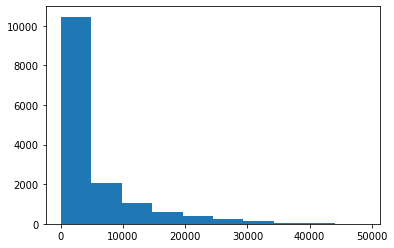

In [15]:
plt.hist(moneydf.groupby('ID')['债权融资额度'].agg(np.std))

(array([1.2041e+04, 1.7460e+03, 7.3200e+02, 3.1500e+02, 1.2400e+02,
        4.7000e+01, 2.9000e+01, 1.1000e+01, 2.0000e+00, 3.0000e+00]),
 array([    0. ,  5765.2, 11530.4, 17295.6, 23060.8, 28826. , 34591.2,
        40356.4, 46121.6, 51886.8, 57652. ]),
 <a list of 10 Patch objects>)

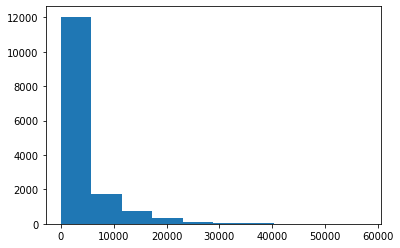

In [16]:
plt.hist(moneydf.groupby('ID')['债权融资额度'].agg(np.mean))

In [17]:
plt.hist(moneydf['债权融资额度'】)

SyntaxError: invalid character in identifier (<ipython-input-17-84521a969b83>, line 1)

C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([3.9021e+04, 2.5760e+03, 1.3420e+03, 7.5800e+02, 4.3500e+02,
        2.8300e+02, 1.5900e+02, 7.7000e+01, 4.4000e+01, 8.0000e+00]),
 array([    0. ,  8474.5, 16949. , 25423.5, 33898. , 42372.5, 50847. ,
        59321.5, 67796. , 76270.5, 84745. ]),
 <a list of 10 Patch objects>)

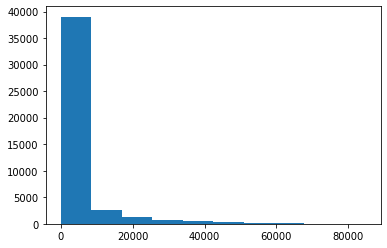

In [18]:
plt.hist(moneydf['债权融资额度'])

(array([1., 0., 0., 0., 0., 1., 0., 0., 0., 1.]),
 array([44066144. , 45028513.7, 45990883.4, 46953253.1, 47915622.8,
        48877992.5, 49840362.2, 50802731.9, 51765101.6, 52727471.3,
        53689841. ]),
 <a list of 10 Patch objects>)

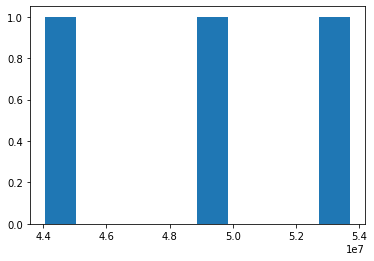

In [19]:
plt.hist(moneydf.groupby('year')['债权融资额度'].agg(np.sum))

In [20]:
debtTmpdf = moneydf[['债权融资额度', '债权融资成本']]

In [21]:
debtTmpdf.head()

,债权融资额度,债权融资成本
0,0.0,0.0
1,0.0,0.0
2,19340.0,1547.2
3,0.0,0.0
4,0.0,0.0


In [22]:
debt = debtTmpdf

In [23]:
debt[debt.isnull().T.any()]

,债权融资额度,债权融资成本
73,NaN,0.0
90,NaN,0.0
176,0.0,NaN
187,0.0,NaN
235,0.0,NaN
...,...,...
44756,NaN,0.0
44823,NaN,2988.0
45030,NaN,0.0
45099,NaN,0.0


In [24]:
debt.columns = ['A', 'B']

In [25]:
debt.head()

,A,B
0,0.0,0.0
1,0.0,0.0
2,19340.0,1547.2
3,0.0,0.0
4,0.0,0.0


In [26]:
debt.A.head()

0        0.0
1        0.0
2    19340.0
3        0.0
4        0.0
Name: A, dtype: float64

In [27]:
debt[debt.A.isnull() ^ debt.B.isnull()]

,A,B
73,NaN,0.0
90,NaN,0.0
176,0.0,NaN
187,0.0,NaN
235,0.0,NaN
...,...,...
44756,NaN,0.0
44823,NaN,2988.0
45030,NaN,0.0
45099,NaN,0.0


In [28]:
xordebt = debt[debt.A.isnull() ^ debt.B.isnull()]

In [29]:
debt[debt.A.isnull() & (!debt.B.isnull())]

SyntaxError: invalid syntax (<ipython-input-29-7446870943ab>, line 1)

In [30]:
debt[debt.A.isnull() & (~debt.B.isnull())]

,A,B
73,NaN,0.0
90,NaN,0.0
339,NaN,0.0
796,NaN,0.0
807,NaN,0.0
...,...,...
44756,NaN,0.0
44823,NaN,2988.0
45030,NaN,0.0
45099,NaN,0.0


In [31]:
quotaNullIndex = debt.A.isnull() & (~debt.B.isnull())
costNullIndex = (~debt.A.isnull()) & debt.B.isnull()

In [32]:
debt.loc['A', ]

KeyError: 'A'

In [33]:
debt.loc['A', :]

KeyError: 'A'

In [34]:
debt.loc['A']

KeyError: 'A'

In [35]:
debt.loc[:, 'A']

0            0.0
1            0.0
2        19340.0
3            0.0
4            0.0
          ...   
45145        0.0
45146        0.0
45147        0.0
45148        0.0
45149        0.0
Name: A, Length: 45150, dtype: float64

In [36]:
debt.loc[quotaNullIndex:, 'A']

TypeError: '0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool' is an invalid key

In [37]:
debt.A[quotaNullIndex]

73      NaN
90      NaN
339     NaN
796     NaN
807     NaN
         ..
44756   NaN
44823   NaN
45030   NaN
45099   NaN
45136   NaN
Name: A, Length: 441, dtype: float64

In [38]:
debt.A[quotaNullIndex] = debt.B[quotaNullIndex]/0.08
debt.B[costNullIndex] = debt.A[costNullIndex]*0.08

C:\Users\MX\Anaconda3\lib\site-packages\pandas\core\generic.py:9114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)
C:\Users\MX\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [39]:
debt.isnull().sum()

A    6
B    6
dtype: int64

In [40]:
debt[debt.isnull().T.any()]

,A,B
3147,NaN,NaN
10207,NaN,NaN
19174,NaN,NaN
19823,NaN,NaN
23092,NaN,NaN
41278,NaN,NaN


In [41]:
debt.isnull().T.any()

0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool

In [42]:
moneydf[debt.isnull().T.any()]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
3147,238656,2016.0,NaN,NaN,11568.00,462.7200,0.0,0.000,0.0,0.0
10207,742677,2015.0,NaN,NaN,0.00,0.0000,0.0,0.000,0.0,0.0
19174,1357407,2015.0,NaN,NaN,31.86,1.2744,0.0,0.000,0.0,0.0
19823,1386568,2017.0,NaN,NaN,21073.92,842.9568,0.0,0.000,0.0,0.0
23092,5971953,2015.0,NaN,NaN,0.00,0.0000,15487.2,929.232,0.0,0.0
41278,5974149,2017.0,NaN,NaN,0.00,0.0000,0.0,0.000,843.6,NaN


In [43]:
moneydf[moneydf.ID.isin(moneydf[debt.isnull().T.any()].ID)]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
3002,238656,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,5061.0,303.660
3147,238656,2016.0,NaN,NaN,11568.00,462.7200,0.0,0.000,0.0,0.000
3292,238656,2017.0,0.0,0.00,64780.80,2591.2320,0.0,0.000,0.0,0.000
10207,742677,2015.0,NaN,NaN,0.00,0.0000,0.0,0.000,0.0,0.000
10353,742677,2016.0,7686.0,614.88,0.00,0.0000,0.0,0.000,0.0,0.000
10499,742677,2017.0,0.0,0.00,0.00,0.0000,0.0,0.000,896.7,53.802
19174,1357407,2015.0,NaN,NaN,31.86,1.2744,0.0,0.000,0.0,0.000
19312,1357407,2016.0,3540.0,283.20,0.00,0.0000,0.0,0.000,0.0,0.000
19450,1357407,2017.0,0.0,0.00,0.00,0.0000,0.0,0.000,1168.2,70.092
19567,1386568,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,1344.0,80.640


In [44]:
moneydf[moneydf.ID.isin(moneydf[debt.isnull().T.any()].ID)].sort_values(['ID', 'year'])

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
3002,238656,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,5061.0,303.660
3147,238656,2016.0,NaN,NaN,11568.00,462.7200,0.0,0.000,0.0,0.000
3292,238656,2017.0,0.0,0.00,64780.80,2591.2320,0.0,0.000,0.0,0.000
10207,742677,2015.0,NaN,NaN,0.00,0.0000,0.0,0.000,0.0,0.000
10353,742677,2016.0,7686.0,614.88,0.00,0.0000,0.0,0.000,0.0,0.000
10499,742677,2017.0,0.0,0.00,0.00,0.0000,0.0,0.000,896.7,53.802
19174,1357407,2015.0,NaN,NaN,31.86,1.2744,0.0,0.000,0.0,0.000
19312,1357407,2016.0,3540.0,283.20,0.00,0.0000,0.0,0.000,0.0,0.000
19450,1357407,2017.0,0.0,0.00,0.00,0.0000,0.0,0.000,1168.2,70.092
19567,1386568,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,1344.0,80.640


In [45]:
debt.A.value_counts()

0.0        33962
720.0         13
5940.0        12
7200.0        12
5040.0        11
           ...  
4700.0         1
6710.0         1
7111.0         1
23584.0        1
12512.0        1
Name: A, Length: 6515, dtype: int64

C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\MX\Anaconda3\lib\site-packages\numpy\lib\histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([3.9412e+04, 2.6020e+03, 1.3530e+03, 7.6200e+02, 4.3900e+02,
        2.8800e+02, 1.5900e+02, 7.7000e+01, 4.4000e+01, 8.0000e+00]),
 array([    0. ,  8474.5, 16949. , 25423.5, 33898. , 42372.5, 50847. ,
        59321.5, 67796. , 76270.5, 84745. ]),
 <a list of 10 Patch objects>)

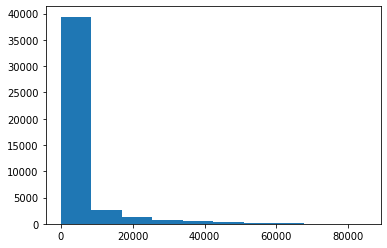

In [46]:
plt.hist(debt.A)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000247F74FA860>,
      dtype=object)

C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 20538 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 26435 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 34701 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 36164 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 25104 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\MX\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 26412 missing from current font.
  fon

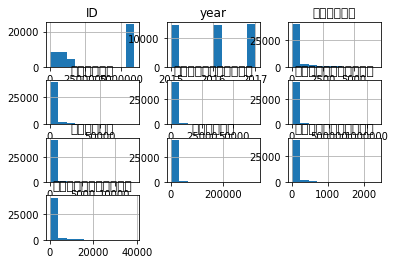

In [47]:
moneydf.hist()

In [48]:
# fill NA in patentdf
patentdf = pd.concat([patentdf['ID'], 
                      pd.get_dummies(patentdf['专利'], prefix='专利'), 
                      pd.get_dummies(patentdf['商标'], prefix='商标'), 
                      pd.get_dummies(patentdf['著作权'], prefix='著作权')], axis=1)


KeyError: '专利'

In [49]:
import pandas as pd
import matplotlib.pyplot as plt


In [50]:
basedf = pd.read_csv('dataset/base_train_sum.csv')
moneydf = pd.read_csv('dataset/money_report_train_sum.csv')
patentdf = pd.read_csv('dataset/patent_train_sum.csv')
reportdf = pd.read_csv('dataset/year_report_train_sum.csv')


In [51]:
# fill NA in basedf
basedfNumric = basedf[['ID', '注册时间', '注册资本', '控制人持股比例']]
basedfNumric = basedfNumric.fillna(basedfNumric.mean())
basedf = pd.concat([basedfNumric,
                    pd.get_dummies(basedf['行业'], prefix='行业'),
                    pd.get_dummies(basedf['区域'], prefix='区域'),
                    pd.get_dummies(basedf['企业类型'], prefix='企业类型'),
                    pd.get_dummies(basedf['控制人类型'], prefix='控制人类型'),
                    basedf['flag']], axis=1)


In [52]:
# fill NA in patentdf
patentdf = pd.concat([patentdf['ID'], 
                      pd.get_dummies(patentdf['专利'], prefix='专利'), 
                      pd.get_dummies(patentdf['商标'], prefix='商标'), 
                      pd.get_dummies(patentdf['著作权'], prefix='著作权')], axis=1)


In [53]:
moneydf.dtypes

ID               int64
year           float64
债权融资额度         float64
债权融资成本         float64
股权融资额度         float64
股权融资成本         float64
内部融资和贸易融资额度    float64
内部融资和贸易融资成本    float64
项目融资和政策融资额度    float64
项目融资和政策融资成本    float64
dtype: object

In [54]:
moneyCategories = ['债权融资', '股权融资', '内部融资和贸易融资', '项目融资和政策融资']
for c in moneyCategories:
  quotaNull = moneydf[c+'额度'].isnull() & (~moneydf[c+'成本'].isnull())
  costNull = ~moneydf[c+'额度'].isnull() & moneydf[c+'成本'].isnull()
  bothNull = moneydf[c+'额度'].isnull() | moneydf[c+'成本'].isnull()
  print(f'quota: ${quotaNull}, cost: ${costNull}, both: ${bothNull}')


quota: $0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool, cost: $0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool, both: $0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool
quota: $0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool, cost: $0        False
1        False
2        False
3        False
4        False
         ...  
45145    False
45146    False
45147    False
45148    False
45149    False
Length: 45150, dtype: bool,

In [55]:
moneyCategories = ['债权融资', '股权融资', '内部融资和贸易融资', '项目融资和政策融资']
for c in moneyCategories:
  quotaNull = moneydf[c+'额度'].isnull() & (~moneydf[c+'成本'].isnull())
  costNull = ~moneydf[c+'额度'].isnull() & moneydf[c+'成本'].isnull()
  bothNull = moneydf[c+'额度'].isnull() | moneydf[c+'成本'].isnull()
  print(f'${c}: quota: ${quotaNull.sum()}, cost: ${costNull.sum()}, both: ${bothNull.sum()}')


$债权融资: quota: $441, cost: $416, both: $863
$股权融资: quota: $420, cost: $438, both: $865
$内部融资和贸易融资: quota: $452, cost: $486, both: $942
$项目融资和政策融资: quota: $437, cost: $472, both: $915


In [56]:
moneyCategories = ['债权融资', '股权融资', '内部融资和贸易融资', '项目融资和政策融资']
for c in moneyCategories:
  quotaNull = moneydf[c+'额度'].isnull() & (~moneydf[c+'成本'].isnull())
  costNull = ~moneydf[c+'额度'].isnull() & moneydf[c+'成本'].isnull()
  bothNull = moneydf[c+'额度'].isnull() & moneydf[c+'成本'].isnull()
  null = moneydf[c+'额度'].isnull() | moneydf[c+'成本'].isnull()
  print(f'${c}: null:${null.sum()} quota: ${quotaNull.sum()}, cost: ${costNull.sum()}, both: ${bothNull.sum()}')


$债权融资: null:$863 quota: $441, cost: $416, both: $6
$股权融资: null:$865 quota: $420, cost: $438, both: $7
$内部融资和贸易融资: null:$942 quota: $452, cost: $486, both: $4
$项目融资和政策融资: null:$915 quota: $437, cost: $472, both: $6


In [57]:
moneyCategories = ['债权融资', '股权融资', '内部融资和贸易融资', '项目融资和政策融资']
for c in moneyCategories:
  quota = c+'额度'
  cost = c+'成本'
  s = moneydf[cost][moneydf[cost]!=0]/moneydf[quota][moneydf[quota]!=0]
  s.describe()
  # rate = 0.08
  # quotaNull = moneydf[quota].isnull() & (~moneydf[cost].isnull())
  # costNull = ~moneydf[quota].isnull() & moneydf[cost].isnull()
  # moneydf[quota][quotaNull] = 

  # bothNull = moneydf[quota].isnull() & moneydf[cost].isnull()
  # null = moneydf[quota].isnull() | moneydf[cost].isnull()
  # print(f'${c}: null:${null.sum()} quota: ${quotaNull.sum()}, cost: ${costNull.sum()}, both: ${bothNull.sum()}')


In [58]:
moneyCategories = ['债权融资', '股权融资', '内部融资和贸易融资', '项目融资和政策融资']
for c in moneyCategories:
  quota = c+'额度'
  cost = c+'成本'
  s = moneydf[cost][moneydf[cost]!=0]/moneydf[quota][moneydf[quota]!=0]
  print(s.describe())
  # rate = 0.08
  # quotaNull = moneydf[quota].isnull() & (~moneydf[cost].isnull())
  # costNull = ~moneydf[quota].isnull() & moneydf[cost].isnull()
  # moneydf[quota][quotaNull] = 

  # bothNull = moneydf[quota].isnull() & moneydf[cost].isnull()
  # null = moneydf[quota].isnull() | moneydf[cost].isnull()
  # print(f'${c}: null:${null.sum()} quota: ${quotaNull.sum()}, cost: ${costNull.sum()}, both: ${bothNull.sum()}')


count    1.098900e+04
mean     8.000000e-02
std      1.405994e-14
min      8.000000e-02
25%      8.000000e-02
50%      8.000000e-02
75%      8.000000e-02
max      8.000000e-02
dtype: float64
count    1.095100e+04
mean     4.000000e-02
std      6.981491e-15
min      4.000000e-02
25%      4.000000e-02
50%      4.000000e-02
75%      4.000000e-02
max      4.000000e-02
dtype: float64
count    1.110800e+04
mean     6.000000e-02
std      1.104267e-14
min      6.000000e-02
25%      6.000000e-02
50%      6.000000e-02
75%      6.000000e-02
max      6.000000e-02
dtype: float64
count    1.123000e+04
mean     6.000000e-02
std      1.151451e-14
min      6.000000e-02
25%      6.000000e-02
50%      6.000000e-02
75%      6.000000e-02
max      6.000000e-02
dtype: float64


In [59]:
moneydf.isnull().sum()

ID               0
year           432
债权融资额度         447
债权融资成本         422
股权融资额度         427
股权融资成本         445
内部融资和贸易融资额度    456
内部融资和贸易融资成本    490
项目融资和政策融资额度    443
项目融资和政策融资成本    478
dtype: int64

In [60]:
moneydf[[moneydf.columns]]

KeyError: "None of [Index([('ID', 'year', '债权融资额度', '债权融资成本', '股权融资额度', '股权融资成本', '内部融资和贸易融资额度', '内部融资和贸易融资成本', '项目融资和政策融资额度', '项目融资和政策融资成本')], dtype='object')] are in the [columns]"

In [61]:
moneydf[moneydf.columns.to_list()]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,28,2015.0,0.0,0.0,0.00,0.0000,21648.0,1298.880,0.0,0.000
1,230,2015.0,0.0,0.0,0.00,0.0000,0.0,0.000,470.4,28.224
2,429,2015.0,19340.0,1547.2,0.00,0.0000,0.0,0.000,0.0,0.000
3,693,2015.0,0.0,0.0,0.00,0.0000,0.0,0.000,5350.4,321.024
4,727,2015.0,0.0,0.0,32229.12,1289.1648,0.0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...
45145,5978029,2017.0,0.0,0.0,0.00,0.0000,1117.8,67.068,0.0,0.000
45146,5978030,2017.0,0.0,0.0,0.00,0.0000,0.0,0.000,2371.2,142.272
45147,5978031,2017.0,0.0,0.0,0.00,0.0000,0.0,0.000,2664.9,159.894
45148,5978032,2017.0,0.0,0.0,0.00,0.0000,0.0,0.000,2908.8,174.528


In [62]:
moneydf[moneydf.columns.to_list()[2:]]

,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,0.0,0.0,0.00,0.0000,21648.0,1298.880,0.0,0.000
1,0.0,0.0,0.00,0.0000,0.0,0.000,470.4,28.224
2,19340.0,1547.2,0.00,0.0000,0.0,0.000,0.0,0.000
3,0.0,0.0,0.00,0.0000,0.0,0.000,5350.4,321.024
4,0.0,0.0,32229.12,1289.1648,0.0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...
45145,0.0,0.0,0.00,0.0000,1117.8,67.068,0.0,0.000
45146,0.0,0.0,0.00,0.0000,0.0,0.000,2371.2,142.272
45147,0.0,0.0,0.00,0.0000,0.0,0.000,2664.9,159.894
45148,0.0,0.0,0.00,0.0000,0.0,0.000,2908.8,174.528


In [63]:
moneydf[moneydf.year.isnull()]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
5,990,NaN,0.0,0.0,0.00,0.0000,0.0,0.000,675.2,40.512
151,3719,NaN,0.0,0.0,0.00,0.0000,81595.8,4895.748,0.0,0.000
181,10813,NaN,0.0,0.0,5719.68,228.7872,0.0,0.000,0.0,0.000
273,693,NaN,0.0,0.0,32102.40,1284.0960,0.0,0.000,0.0,0.000
487,46556,NaN,0.0,0.0,0.00,0.0000,372985.2,22379.112,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...
44615,5977497,NaN,0.0,0.0,0.00,0.0000,0.0,0.000,4281.6,256.896
44642,5977524,NaN,0.0,0.0,0.00,0.0000,20766.9,1246.014,0.0,0.000
44989,5977873,NaN,0.0,0.0,0.00,0.0000,0.0,0.000,282.0,16.920
45004,5977888,NaN,23075.0,1846.0,0.00,0.0000,0.0,0.000,0.0,0.000


In [64]:
moneydf.year.describe()

count    44718.000000
mean      2016.000291
std          0.816629
min       2015.000000
25%       2015.000000
50%       2016.000000
75%       2017.000000
max       2017.000000
Name: year, dtype: float64

In [65]:
moneydf.groupby('ID').agg(np.count)

AttributeError: module 'numpy' has no attribute 'count'

In [66]:
moneydf.groupby('ID').size()

ID
28         3
230        3
429        3
693        3
727        3
          ..
5978029    3
5978030    3
5978031    3
5978032    3
5978033    3
Length: 15050, dtype: int64

In [67]:
moneydf.groupby('ID').size().describe()

count    15050.0
mean         3.0
std          0.0
min          3.0
25%          3.0
50%          3.0
75%          3.0
max          3.0
dtype: float64

In [68]:
moneydf.groupby('ID').filter(lambda x: len(x[x.year.isnull()]!=0)).size()

TypeError: filter function returned a int, but expected a scalar bool

In [69]:
moneydf.groupby('ID').filter(lambda x: len(x[x.year.isnull()])!=0).size()

TypeError: 'numpy.int32' object is not callable

In [70]:
moneydf[~moneydf.year.isnull()].groupby('ID').size()

ID
28         3
230        3
429        3
693        2
727        3
          ..
5978029    3
5978030    3
5978031    3
5978032    3
5978033    3
Length: 15050, dtype: int64

In [71]:
moneydf[~moneydf.year.isnull()].groupby('ID').size().describe()

count    15050.000000
mean         2.971296
std          0.169743
min          1.000000
25%          3.000000
50%          3.000000
75%          3.000000
max          3.000000
dtype: float64

(array([7.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        4.1800e+02, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.4625e+04]),
 array([1. , 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4, 2.6, 2.8, 3. ]),
 <a list of 10 Patch objects>)

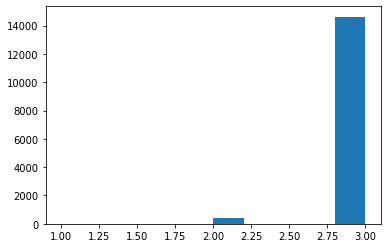

In [72]:
plt.hist(moneydf[~moneydf.year.isnull()].groupby('ID').size())

In [73]:
moneydf[~moneydf.year.isnull()].groupby('ID').size().value_counts()

3    14625
2      418
1        7
dtype: int64

In [74]:
doubleNull = moneydf[~moneydf.year.isnull()].groupby('ID').filter(lambda x: len(x) == 1)

In [75]:
doubleNull

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
5357,403194,2015.0,28140.0,2251.2,0.0,0.0,0.0,0.000,0.0,0.00
15366,1109498,2015.0,0.0,0.0,0.0,0.0,30630.6,1837.836,0.0,0.00
17064,1215404,2015.0,0.0,0.0,0.0,0.0,0.0,0.000,NaN,82.08
18863,1349486,2015.0,0.0,0.0,0.0,0.0,5130.0,307.800,0.0,0.00
22742,5971603,2015.0,8140.0,651.2,0.0,0.0,0.0,0.000,0.0,0.00
39663,5972526,2017.0,0.0,0.0,0.0,0.0,0.0,0.000,1688.0,101.28
44830,5977712,2017.0,0.0,0.0,0.0,0.0,4536.0,272.160,0.0,0.00


In [76]:
moneydf.year.value_counts()

2017.0    14917
2015.0    14904
2016.0    14897
Name: year, dtype: int64

In [77]:
# fill NA in moneydf
moneyCategories = {'债权融资': 0.08, '股权融资': 0.04, '内部融资和贸易融资': 0.06, '项目融资和政策融资': 0.06}
for c, rate in moneyCategories.items():
  quota = c+'额度'
  cost = c+'成本'

  quotaNull = moneydf[quota].isnull() & (~moneydf[cost].isnull())
  costNull = ~moneydf[quota].isnull() & moneydf[cost].isnull()
  moneydf[quota][quotaNull] = moneydf[cost][quotaNull] / rate
  moneydf[cost][costNull] = moneydf[quota][costNull] * rate
# fill 0 except ID and year
moneydf[moneydf.columns.to_list()[2:]].fillna(0)



c:\Users\MX\Projects\zombie-corp\data-preprocessing.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reportdf = pd.read_csv('dataset/year_report_train_sum.csv')
c:\Users\MX\Projects\zombie-corp\data-preprocessing.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,0.0,0.0,0.00,0.0000,21648.0,1298.880,0.0,0.000
1,0.0,0.0,0.00,0.0000,0.0,0.000,470.4,28.224
2,19340.0,1547.2,0.00,0.0000,0.0,0.000,0.0,0.000
3,0.0,0.0,0.00,0.0000,0.0,0.000,5350.4,321.024
4,0.0,0.0,32229.12,1289.1648,0.0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...
45145,0.0,0.0,0.00,0.0000,1117.8,67.068,0.0,0.000
45146,0.0,0.0,0.00,0.0000,0.0,0.000,2371.2,142.272
45147,0.0,0.0,0.00,0.0000,0.0,0.000,2664.9,159.894
45148,0.0,0.0,0.00,0.0000,0.0,0.000,2908.8,174.528


In [78]:
moneydf.isnull().sum()

ID               0
year           432
债权融资额度           6
债权融资成本           6
股权融资额度           7
股权融资成本           7
内部融资和贸易融资额度      4
内部融资和贸易融资成本      4
项目融资和政策融资额度      6
项目融资和政策融资成本      6
dtype: int64

In [79]:
moneydf[moneydf.columns.to_list()[2:]].fillna(0, inplace=True)

C:\Users\MX\Anaconda3\lib\site-packages\pandas\core\frame.py:4259: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


In [80]:
moneydf.isnull().sum()

ID               0
year           432
债权融资额度           6
债权融资成本           6
股权融资额度           7
股权融资成本           7
内部融资和贸易融资额度      4
内部融资和贸易融资成本      4
项目融资和政策融资额度      6
项目融资和政策融资成本      6
dtype: int64

In [81]:
moneydf[moneydf.drop('year', axis=1).isnull().T.any()]

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
805,48533,2017.0,0.0,0.0,4598.16,183.9264,0.0,0.000,NaN,NaN
3147,238656,2016.0,NaN,NaN,11568.00,462.7200,0.0,0.000,0.0,0.000
9030,639764,2016.0,0.0,0.0,0.00,0.0000,0.0,0.000,NaN,NaN
10207,742677,2015.0,NaN,NaN,0.00,0.0000,0.0,0.000,0.0,0.000
10976,779122,2017.0,0.0,0.0,0.00,0.0000,31636.8,1898.208,NaN,NaN
14029,995377,2015.0,0.0,0.0,0.00,0.0000,20088.0,1205.280,NaN,NaN
17184,1208645,2016.0,0.0,0.0,NaN,NaN,0.0,0.000,423.0,25.380
19174,1357407,2015.0,NaN,NaN,31.86,1.2744,0.0,0.000,0.0,0.000
19823,1386568,2017.0,NaN,NaN,21073.92,842.9568,0.0,0.000,0.0,0.000
23092,5971953,2015.0,NaN,NaN,0.00,0.0000,15487.2,929.232,0.0,0.000


In [82]:
moneydf[moneydf.columns.to_list()[2:]].fillna(0)

,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,0.0,0.0,0.00,0.0000,21648.0,1298.880,0.0,0.000
1,0.0,0.0,0.00,0.0000,0.0,0.000,470.4,28.224
2,19340.0,1547.2,0.00,0.0000,0.0,0.000,0.0,0.000
3,0.0,0.0,0.00,0.0000,0.0,0.000,5350.4,321.024
4,0.0,0.0,32229.12,1289.1648,0.0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...
45145,0.0,0.0,0.00,0.0000,1117.8,67.068,0.0,0.000
45146,0.0,0.0,0.00,0.0000,0.0,0.000,2371.2,142.272
45147,0.0,0.0,0.00,0.0000,0.0,0.000,2664.9,159.894
45148,0.0,0.0,0.00,0.0000,0.0,0.000,2908.8,174.528


In [83]:
moneydf[moneydf.columns.to_list()[2:]].fillna(0, inplace=True)

C:\Users\MX\Anaconda3\lib\site-packages\pandas\core\frame.py:4259: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


In [84]:
moneydf.isnull().sum()

ID               0
year           432
债权融资额度           6
债权融资成本           6
股权融资额度           7
股权融资成本           7
内部融资和贸易融资额度      4
内部融资和贸易融资成本      4
项目融资和政策融资额度      6
项目融资和政策融资成本      6
dtype: int64

In [85]:
moneydf[moneydf.columns.to_list()[2:]] = moneydf[moneydf.columns.to_list()[2:]].fillna(0)

In [86]:
moneydf.isnull().sum()

ID               0
year           432
债权融资额度           0
债权融资成本           0
股权融资额度           0
股权融资成本           0
内部融资和贸易融资额度      0
内部融资和贸易融资成本      0
项目融资和政策融资额度      0
项目融资和政策融资成本      0
dtype: int64

In [87]:
moneydf.groupby('ID').filter(lambda x: x.year.isnull().sum()==2)

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
5357,403194,2015.0,28140.0,2251.20,0.00,0.0000,0.0,0.000,0.0,0.000
5490,403194,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,7504.0,450.240
5623,403194,NaN,0.0,0.00,0.00,0.0000,181784.4,10907.064,0.0,0.000
15366,1109498,2015.0,0.0,0.00,0.00,0.0000,30630.6,1837.836,0.0,0.000
15516,1109498,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,4207.5,252.450
15666,1109498,NaN,2992.0,239.36,0.00,0.0000,0.0,0.000,0.0,0.000
17064,1215404,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,1368.0,82.080
17219,1215404,NaN,0.0,0.00,0.00,0.0000,90288.0,5417.280,0.0,0.000
17374,1215404,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,2052.0,123.120
18863,1349486,2015.0,0.0,0.00,0.00,0.0000,5130.0,307.800,0.0,0.000


In [88]:
moneydf.groupby('ID').filter(lambda x: x.year.isnull().sum()==2).sort_values(['ID', 'year'])

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
5357,403194,2015.0,28140.0,2251.20,0.00,0.0000,0.0,0.000,0.0,0.000
5490,403194,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,7504.0,450.240
5623,403194,NaN,0.0,0.00,0.00,0.0000,181784.4,10907.064,0.0,0.000
15366,1109498,2015.0,0.0,0.00,0.00,0.0000,30630.6,1837.836,0.0,0.000
15516,1109498,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,4207.5,252.450
15666,1109498,NaN,2992.0,239.36,0.00,0.0000,0.0,0.000,0.0,0.000
17064,1215404,2015.0,0.0,0.00,0.00,0.0000,0.0,0.000,1368.0,82.080
17219,1215404,NaN,0.0,0.00,0.00,0.0000,90288.0,5417.280,0.0,0.000
17374,1215404,NaN,0.0,0.00,0.00,0.0000,0.0,0.000,2052.0,123.120
18863,1349486,2015.0,0.0,0.00,0.00,0.0000,5130.0,307.800,0.0,0.000


In [89]:
moneydf.index.head)

SyntaxError: invalid syntax (<ipython-input-89-82000f34882a>, line 1)

In [90]:
moneydf.index.head()

AttributeError: 'RangeIndex' object has no attribute 'head'

In [91]:
moneydf.index

RangeIndex(start=0, stop=45150, step=1)

x247fa52c048>,
 ...]

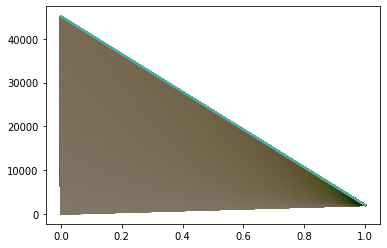

In [92]:
plt.plot([moneydf.index, moneydf.year])

In [93]:
plt.plot([moneydf.index.to_numpy(), moneydf.year.to_numpy()])

x247a6fc2f98>,
 ...]

Error in callback <function flush_figures at 0x00000247F1572048> (for post_execute):


KeyboardInterrupt: 

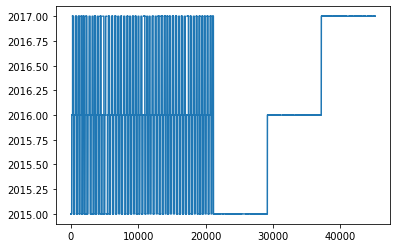

In [94]:
plt.plot(moneydf.index.to_numpy(), moneydf.year.to_numpy())

In [95]:
moneydf.head()

,ID,year,债权融资额度,债权融资成本,股权融资额度,股权融资成本,内部融资和贸易融资额度,内部融资和贸易融资成本,项目融资和政策融资额度,项目融资和政策融资成本
0,28,2015.0,0.0,0.0,0.00,0.0000,21648.0,1298.88,0.0,0.000
1,230,2015.0,0.0,0.0,0.00,0.0000,0.0,0.00,470.4,28.224
2,429,2015.0,19340.0,1547.2,0.00,0.0000,0.0,0.00,0.0,0.000
3,693,2015.0,0.0,0.0,0.00,0.0000,0.0,0.00,5350.4,321.024
4,727,2015.0,0.0,0.0,32229.12,1289.1648,0.0,0.00,0.0,0.000


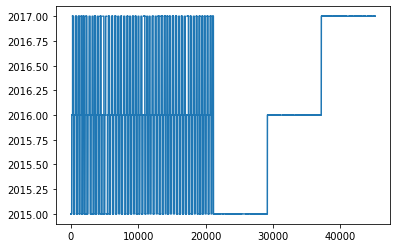

In [96]:
plt.plot(moneydf.year)